c:\Users\Alexandre\anaconda3\envs\spacex_rl\lib\site-packages\pygame\pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists


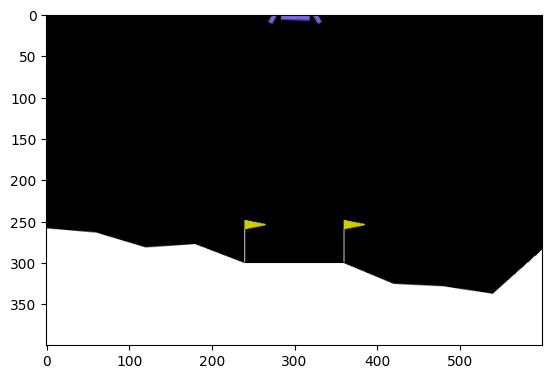

In [ ]:
import gymnasium as gym
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import display, HTML   # très important pour Jupyter

# ────────────────────────────────────────────────
env = gym.make("LunarLander-v3", render_mode="rgb_array")
observation, info = env.reset(seed=42)
frames = []

for _ in range(1000):
    action = env.action_space.sample()
    observation, reward, terminated, truncated, info = env.step(action)
    frames.append(env.render())
    if terminated or truncated:
        observation, info = env.reset()

env.close()

# ────────────────────────────────────────────────
# Création de l'animation
fig = plt.figure(figsize=(6, 6))           # taille raisonnable
plt.axis('off')

img = plt.imshow(frames[0])                 # premier frame

def animate(i):
    img.set_data(frames[i])                 # met à jour l'image
    return [img]

anim = animation.FuncAnimation(
    fig, 
    animate, 
    frames=len(frames), 
    interval=30,                            # ~33 fps → ajuste (20–50 ms)
    blit=True,                              # plus rapide
    repeat=True
)

# Affichage dans Jupyter / Colab
plt.close(fig)                              # évite d'afficher la figure statique
display(HTML(anim.to_jshtml()))

In [ ]:
import gymnasium as gym
from stable_baselines3 import PPO
from stable_baselines3.common.env_util import make_vec_env
from stable_baselines3.common.callbacks import EvalCallback
from stable_baselines3.common.logger import configure

# Créer l'environnement vectorisé (pour parallélisme)
env = make_vec_env("LunarLander-v3", n_envs=4, seed=42)  # Mise à jour vers v3, ajout seed

# Logger pour TensorBoard
logger = configure("logs/", ["tensorboard"])
model = PPO("MlpPolicy", env, verbose=1, tensorboard_log="logs/ppo/", seed=42)  # Ajout seed
model.set_logger(logger)

# Callback pour évaluation périodique
eval_callback = EvalCallback(env, best_model_save_path="./logs/",
                             log_path="./logs/", eval_freq=10000,
                             deterministic=True, render=False)

# Entraîner
model.learn(total_timesteps=1000000, callback=eval_callback)  # 1M steps
# Sauvegarder le modèle final
model.save("ppo_lunar_lander")

In [ ]:
import gymnasium as gym
from stable_baselines3 import PPO
import imageio  # Pour GIF
import numpy as np

env = gym.make("LunarLander-v3", render_mode="rgb_array")  # Mise à jour vers v3
model = PPO.load("ppo_lunar_lander")

# Stats
rewards = []
for i_episode in range(5):  # 100 episodes pour stats
    observation, _ = env.reset(seed=42 + i_episode)  # Seed varié pour diversité
    episode_reward = 0
    frames = []
    done = False
    while not done:
        action, _states = model.predict(observation, deterministic=True)
        observation, reward, terminated, truncated, _ = env.step(action)
        episode_reward += reward
        frames.append(env.render())
        done = terminated or truncated
    rewards.append(episode_reward)
    if i_episode == 0:  # Sauver GIF du premier
        imageio.mimsave('landing'+str(i_episode)+'.gif', [np.array(f) for f in frames], fps=30)
    if i_episode == 1:  # Sauver GIF du premier
        imageio.mimsave('landing'+str(i_episode)+'.gif', [np.array(f) for f in frames], fps=30)
    if i_episode == 2:  # Sauver GIF du premier
        imageio.mimsave('landing'+str(i_episode)+'.gif', [np.array(f) for f in frames], fps=30)
    if i_episode == 3:  # Sauver GIF du premier
        imageio.mimsave('landing'+str(i_episode)+'.gif', [np.array(f) for f in frames], fps=30)
env.close()

# Analyse statistique
print(f"Mean reward: {np.mean(rewards):.2f}")
print(f"Std dev: {np.std(rewards):.2f}")
print(f"Success rate: {np.sum(np.array(rewards) > 200) / 100:.2%}")  # >200 souvent succès

Mean reward: 198.38
Std dev: 61.82
Success rate: 3.00%
